# Spy analysis:

- About the data:
  
    -  The dataset contains over thirty years of daily SPY values from its inception in Jan 1993 to the end of Sept 2024.
    -  In this analysis we won't be adjusting the data for inflation, so the data has a deterministic trend. Inflation adjusted one has a stochastic trend.
    -  We expect the seasonality to be weekly. To decide this we normally need to compare the residuals for each seasonality but we will not be doing that here since I have done that somewhere else before and remember it.

## Load the libraries:
    Here we load the libraries that we are going to be using throughout the project.

In [230]:
import polars as pl # Memory? What is that? We borrow.
import pandas as pd # Pandas for some of the libraries that doesn't support polars.
import matplotlib.pyplot as plt # For visualizing.
import math # For the built in math functions.
import seaborn as sns # For visualizing.
import numpy as np # For linear algebra
import pandas_market_calendars as mcal # For accurate trading days.
from pandas.plotting import autocorrelation_plot # ACF plot.
import time

from scipy import stats
from scipy.stats import boxcox # Box-Cox transformation

# Anomaly detection.
from adtk.data import validate_series
from adtk.visualization import plot
from adtk.transformer import ClassicSeasonalDecomposition
from adtk.detector import ThresholdAD, SeasonalAD

# For scoring
from sklearn.metrics import mean_squared_error

exec(open('hegy.py', 'r').read())
from hegy import hegy_test

# Statsmodels for statistical analysis and forecasting.
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import het_arch
from statsmodels.tsa.api import SimpleExpSmoothing
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_lm

# For comparison
from prophet import Prophet 

from jormund import * # Personal library.
setup_plots() # To make the graphs look better.

import gc # garbage collection

# To ignore the annoying warnings.
import warnings
def ignore_warn(*args, **kwargs):
    pass
warnings.warn = ignore_warn

%matplotlib inline

## Load the data and adjust datetime:
    Here we load the dataset and then make the string 'Date' column a datetime column 'date'. This way it will be easier to work on the dataset.

In [3]:
spy = pl.read_csv('spy.csv')
spy = spy.with_columns([
    pl.col("Date").str.strptime(pl.Date, "%Y-%m-%d").alias("date")
])
spy = spy.drop('Date')

## Seperate the data:
    Here we seperate the data into train and test dataframes so that there is no leak while we are analyzing the data.

In [4]:
train = spy.filter(pl.col("Year") < 2024).drop(['Open', 'High', 'Low', 'Volume'])
test = spy.filter(pl.col("Year") == 2024).drop(['Open', 'High', 'Low', 'Volume'])

    - train: the data we will be analyzing (i.e. train + validation + test).
    - test: the final data we will be testing the time series model on (i.e. holdout).

Since we are analyzing both the validation and the test parts along with the train part this introduces a bias toward it, although not very significant we should still try to avoid using them together when using them in the future.

## Visualization:
- In this step we will be interpreting the data using:
  - The starting date and the ending date for the dataset.
  - The frequency of the data.
  - Visualizing to see trend and seasonality.
  - Visualizing for stationarity.

In [45]:
train.head(10).to_pandas().T

,0,1,2,3,4,5,6,7,8,9
Close,24.608625,24.783648,24.836166,25.098698,25.203728,25.186205,25.186205,25.011187,25.046185,25.168703
Day,29,1,2,3,4,5,8,9,10,11
Weekday,4,0,1,2,3,4,0,1,2,3
Week,4,5,5,5,5,5,6,6,6,6
Month,1,2,2,2,2,2,2,2,2,2
Year,1993,1993,1993,1993,1993,1993,1993,1993,1993,1993
date,1993-01-29 00:00:00,1993-02-01 00:00:00,1993-02-02 00:00:00,1993-02-03 00:00:00,1993-02-04 00:00:00,1993-02-05 00:00:00,1993-02-08 00:00:00,1993-02-09 00:00:00,1993-02-10 00:00:00,1993-02-11 00:00:00


In [43]:
train.to_pandas().memory_usage(deep=True).T / 1e3 # KB

Index       0.132
Close      62.288
Day        62.288
Weekday    62.288
Week       62.288
Month      62.288
Year       62.288
date       62.288
dtype: float64

In [32]:
print('Train \n start date: ', train['date'][0], "\n end date: ", train['date'][-1])
print('\nTest \n start date: ', test['date'][0], "\n end date: ", test['date'][-1])

Train 
 start date:  1993-01-29 
 end date:  2023-12-29

Test 
 start date:  2024-01-02 
 end date:  2024-09-30


In [7]:
train.describe().to_pandas().T

,0,1,2,3,4,5,6,7,8
statistic,count,null_count,mean,std,min,25%,50%,75%,max
Close,7786.0,0.0,140.733168,111.387159,24.311077,69.957664,92.607559,179.530319,472.236877
Day,7786.0,0.0,15.734652,8.75388,1.0,8.0,16.0,23.0,31.0
Weekday,7786.0,0.0,2.021577,1.399623,0.0,1.0,2.0,3.0,4.0
Week,7786.0,0.0,26.684819,14.935152,1.0,14.0,27.0,40.0,53.0
Month,7786.0,0.0,6.556512,3.421636,1.0,4.0,7.0,10.0,12.0
Year,7786.0,0.0,2008.026586,8.927004,1993.0,2000.0,2008.0,2016.0,2023.0
date,7786,0,2008-07-12 05:16:04.500000,None,1993-01-29,2000-10-12,2008-07-15,2016-04-07,2023-12-29


In [28]:
frequency = spy.select(
    (pl.col("date").diff()).alias("frequency")
)
frequency.to_pandas().T

,0,1,2,3,4,5,6,7,8,9,...,7964,7965,7966,7967,7968,7969,7970,7971,7972,7973
frequency,NaT,3 days,1 days,1 days,1 days,1 days,3 days,1 days,1 days,1 days,...,1 days,1 days,1 days,1 days,3 days,1 days,1 days,1 days,1 days,3 days


In [29]:
del frequency

In [37]:
round(len(spy.filter(pl.col('Year') == 2000)) / 52) # 2000 has no significance just chosen randomly

5

    - There are no missing values in both the date and the target columns.
    - Although the data is a daily data the frequency is 5 that is because the stock exchange is only open at weekdays and closed in weekends.

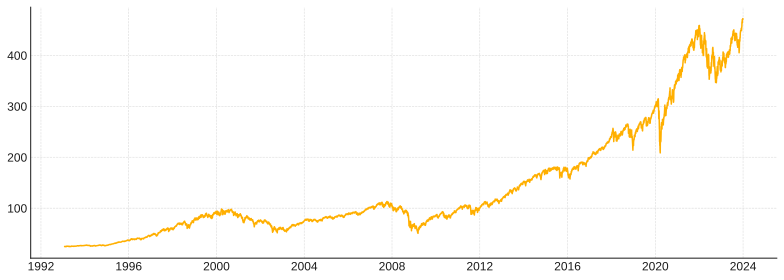

In [22]:
plt.figure(figsize=(11, 4))
plt.plot(train['date'], train['Close'])
plt.tight_layout()
plt.show()

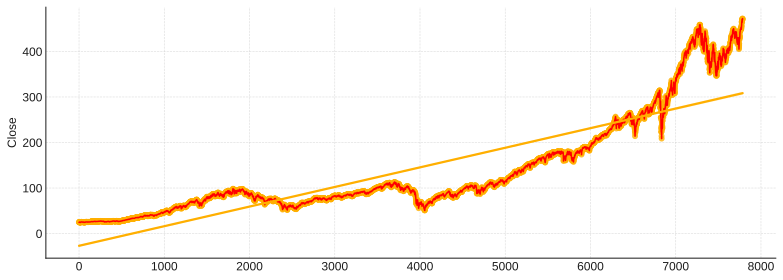

In [149]:
# Plot rolling statistics
plt.figure(figsize=(11, 4))
plt.plot(range(len(train)), train['Close'].to_pandas(), color='red')
sns.regplot(x=np.array(range(len(train))), y=train['Close'].to_pandas())
plt.tight_layout()
plt.show()

    - From the graph it is clearly seen that the graph has an upward deterministic trend. So this data is probably not stationary but let's take a look at the acf plots and make sure that it is not stationary.
    - There doesn't seem to be a outliers from this graph.
    - It seems like there is seasonality to the data. The seasonality can be seen clearly until around 2010 but after that it still shows the same behaviour only this time it is values themselvesd are a lot bigger so the seasonality looks like it ended.

## Box-Cox:
    - Here we will be analyzing the data to see if we need to apply the Box-Cox transformation and if we need to apply it, apply it.

In [9]:
# Rolling mean and standard deviation
rolling_mean = train['Close'].to_pandas().rolling(window=100).mean()
rolling_std = train['Close'].to_pandas().rolling(window=100).std()

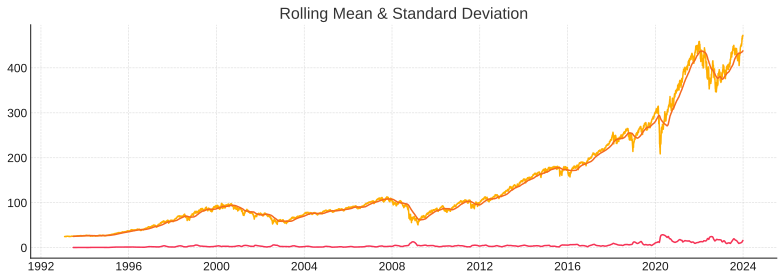

In [10]:
# Plot rolling statistics
plt.figure(figsize=(11, 4))
plt.plot(train['date'], train['Close'], label='Original Series')
plt.plot(train['date'], rolling_mean, label='Rolling Mean')
plt.plot(train['date'], rolling_std, label='Rolling Std')
plt.title('Rolling Mean & Standard Deviation')
plt.tight_layout()
plt.show()

    - It looks like variance isn't much dependent on the time. So we might not need to use the Box-Cox transformation.
    - Still we should take a look at the infromation criterion values to be sure that we do not need to transform the data.

In [29]:
arch_test = het_arch(train['Close'])
print('ARCH Test:')
print(f'LM Statistic: {arch_test[0]},\np-value: {arch_test[1]}')

ARCH Test:
LM Statistic: 7770.996107057737,
p-value: 0.0


    - Seems like the data does have heteroscedasticity according to the Engle’s ARCH test so we have even more reasons to try Box-Cox and see the difference.

### Box-Cox transformation:

\begin{array}{1}
y(\lambda) = 
\begin{cases} 
\frac{y^\lambda - 1}{\lambda} & \text{if } \lambda \neq 0, \\
\ln(y) & \text{if } \lambda = 0.
\end{cases}
\end{array}

Optimal Lambda: -0.07279992892834346


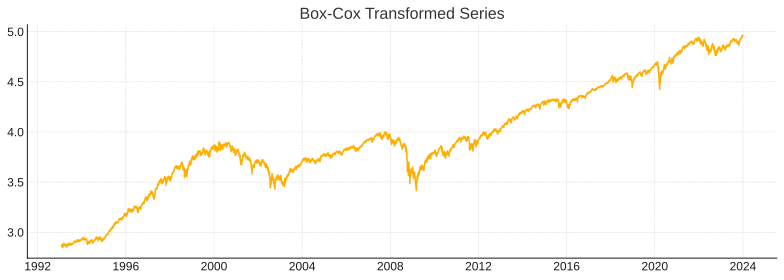

In [5]:
# Perform Box-Cox transformation
transformed_series, lambda_value = boxcox(train["Close"])
print(f'Optimal Lambda: {lambda_value}')

# Plot transformed series
plt.figure(figsize=(11, 4))
plt.plot(train['date'], transformed_series)
plt.title('Box-Cox Transformed Series')
plt.tight_layout()
plt.show()

In [6]:
model_original = SimpleExpSmoothing(train["Close"].to_pandas()).fit()
# forecast_original = model_original.forecast(steps=12)

# Calculate AIC/BIC
aic_original = model_original.aic
bic_original = model_original.bic
print(f"Original Series: AIC={aic_original}, BIC={bic_original}")

Original Series: AIC=10848.707918432545, BIC=10862.628083488886


In [7]:
model_transformed = SimpleExpSmoothing(transformed_series).fit()
# forecast_original = model_original.forecast(steps=12)

# Calculate AIC/BIC
aic_transformed = model_transformed.aic
bic_transformed = model_transformed.bic
print(f"Transformed Series: AIC={aic_transformed}, BIC={bic_transformed}")

Transformed Series: AIC=-74364.73304958692, BIC=-74350.81288453059


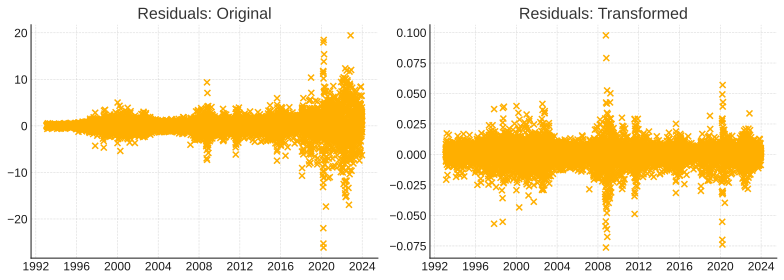

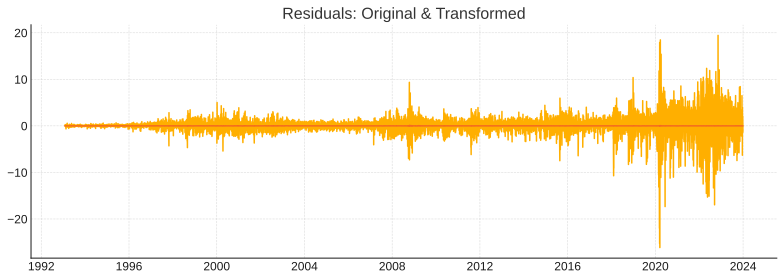

In [12]:
residuals_original = train['Close'].to_pandas() - model_original.fittedvalues
residuals_transformed = transformed_series - model_transformed.fittedvalues

# Plot residuals
plt.figure(figsize=(11, 4))
plt.subplot(1, 2, 1)
plt.scatter(train['date'].to_pandas(), residuals_original)
plt.title('Residuals: Original')

plt.subplot(1, 2, 2)
plt.scatter(train['date'].to_pandas(), residuals_transformed)
plt.title('Residuals: Transformed')
plt.tight_layout()
plt.show()

# Plot rolling statistics
plt.figure(figsize=(11, 4))
plt.plot(train['date'].to_pandas(), residuals_original, label='Residuals: Original')
plt.plot(train['date'].to_pandas(), residuals_transformed, label='Residuals: Transformed')
plt.title('Residuals: Original & Transformed')
plt.tight_layout()
plt.show()

    - Since there is a significant difference in the information criterions we should take the transformed data from here on out.
    - This is also can be seen by the models performance, even though heteroxcedasticity still persists the performance increased significantly.

In [6]:
train = train.with_columns(pl.Series('tclose', transformed_series))

#### Lambda used:

    -0.07279992892834346

## Outlier detection:

In [7]:
atest = train.clone().to_pandas().set_index('date')
series = atest['tclose']

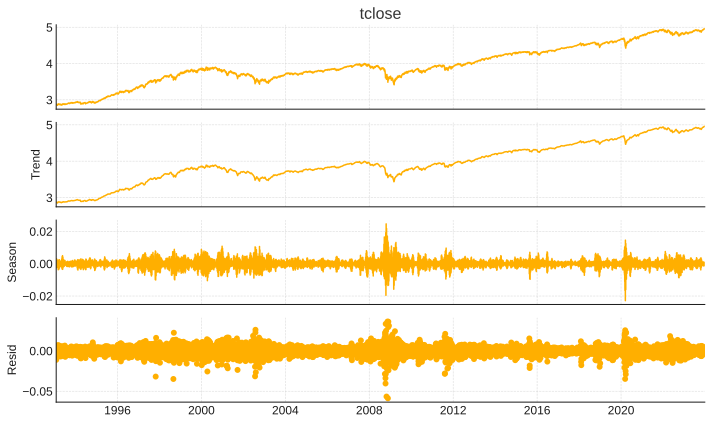

In [27]:
stl = STL(series, period=5).fit()
stl.plot()
plt.show()

### Rolling z-score:

In [28]:
z_score = (stl.resid - stl.resid.rolling(window=90).mean()) / stl.resid.rolling(window=90).std()
train = train.with_columns(pl.Series('z_score', z_score))
train['z_score'].describe().to_pandas().T

,0,1,2,3,4,5,6,7,8
statistic,count,null_count,mean,std,min,25%,50%,75%,max
value,7697.0,89.0,0.003926,1.028576,-5.611373,-0.593761,0.052019,0.644845,5.694772


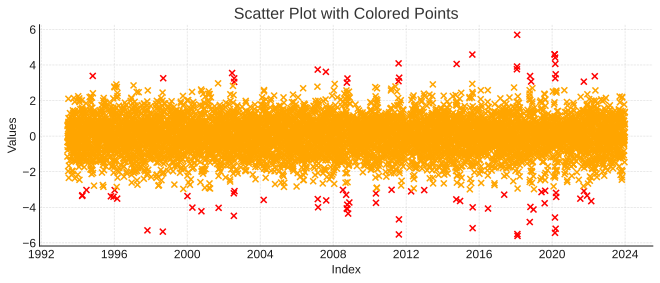

In [29]:
color_conditions = [
    (z_score < -3) | (z_score > 3),
    (z_score >= -3) & (z_score <= 3)
]
colors = ['red', 'orange']

plt.figure(figsize=(11, 4))

for condition, color in zip(color_conditions, colors):
    plt.scatter(z_score[condition].index, z_score[condition], color=color, label=f'{color} points')

plt.xlabel('Index')
plt.ylabel('Values')
plt.title('Scatter Plot with Colored Points')
plt.show()

In [30]:
anomalies = z_score[(z_score > 3) | (z_score < -3)].index
regular = z_score[(z_score <= 3) & (z_score >= -3)].index

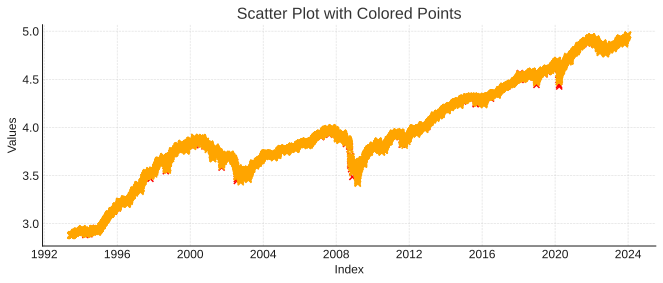

In [31]:
color_conditions = [
    anomalies,
    regular
]
colors = ['red', 'orange']

plt.figure(figsize=(11, 4))

for condition, color in zip(color_conditions, colors):
    plt.scatter(series[condition].index, series[condition], color=color, label=f'{color} points')

plt.xlabel('Index')
plt.ylabel('Values')
plt.title('Scatter Plot with Colored Points')
plt.show()

In [32]:
series.loc[anomalies] = np.nan
series = series.interpolate(method='linear')

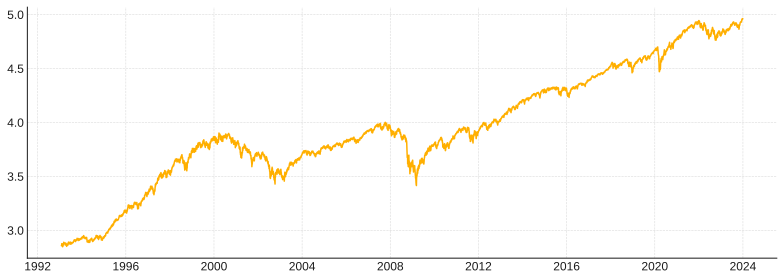

In [33]:
plt.figure(figsize=(11, 4))
plt.plot(series)
plt.tight_layout()
plt.show()

In [34]:
train = train.with_columns(
    (pl.Series(series)).alias('tclose_adjusted')
)

In [35]:
train['tclose_adjusted'].describe().to_pandas().T

,0,1,2,3,4,5,6,7,8
statistic,count,null_count,mean,std,min,25%,50%,75%,max
value,7786.0,0.0,3.942483,0.531675,2.847413,3.654469,3.857641,4.322412,4.962423


Z-score of every value in the residual series we got from the STL decomposition shows that there are some values that can be considered anomalies, so we just fill those values using the linear method.

## Unit root tests:
    - Here we will be analyzing the data to see if the data is stationary for sure.
    - We will also be analyzing the data to see if the data is seasonal for sure.

In [38]:
def adf_results(data, series):
    for r in ["c", "ct"]:
        adf_result = adfuller(data[series], regression=r, autolag='BIC')
    
        print(f'Augmented Dickey-Fuller Test: {r}')
        print(f'ADF Statistic: {adf_result[0]}')
        print(f'p-value: {adf_result[1]} \n')

In [39]:
def kpss_results(data, series):
    for r in ["c", "ct"]:
        kpss_result = kpss(data[series], regression='c', nlags="auto")
        
        print(f'KPSS Test: {r}')
        print(f'KPSS Statistic: {kpss_result[0]}')
        print(f'p-value: {kpss_result[1]} \n')

In [40]:
def acf_pacf(data, series, lags1, lags2):
    plot_acf(data[series], lags=lags1)
    plt.xlabel('Lags', fontsize=12)
    plt.ylabel('AC', fontsize=12)
    plt.show()
    plot_pacf(data[series], lags=lags2)
    plt.xlabel('Lags', fontsize=12)
    plt.ylabel('PAC', fontsize=12)
    plt.show()

In [41]:
def time_series_plot(data, series):
    plt.figure(figsize=(11, 4))
    plt.plot(data['date'], data[series])
    plt.tight_layout()
    plt.show()

In [42]:
def decompose_plot(data, series, period):
    stl = seasonal_decompose(data[series], period=period)
    stl.plot()
    plt.show()
    return stl

In [43]:
def unit_root_test(data, series, lags1, lags2, period):
    
    time_series_plot(data, series)
    decompose_plot(data, series, period)
    acf_pacf(data, series, lags1, lags2)
    
    adf_results(data, series)
    kpss_results(data, series)

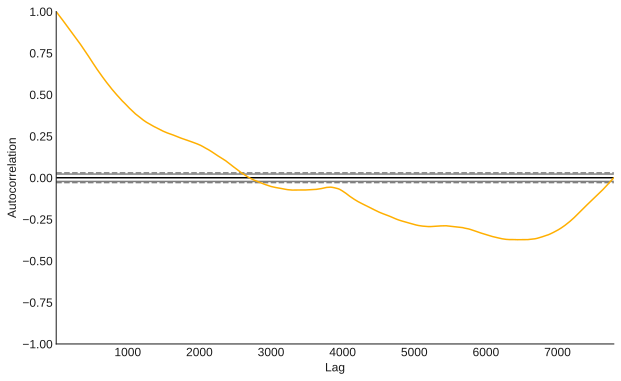

In [53]:
autocorrelation_plot(train['tclose_adjusted'])
plt.show()

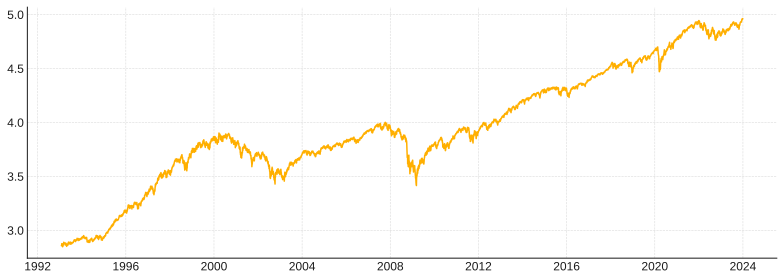

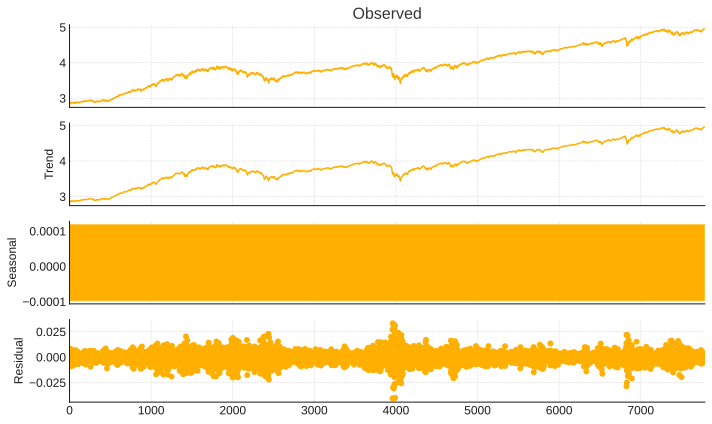

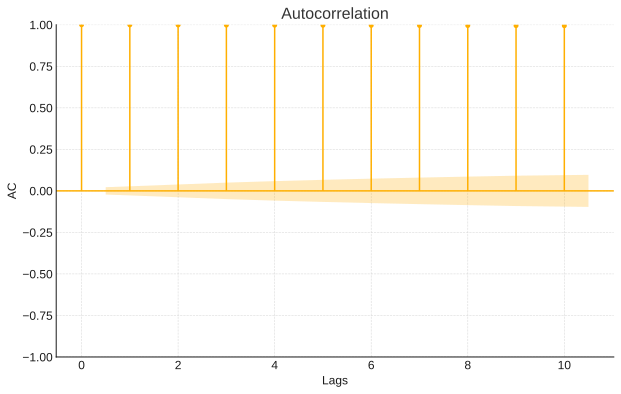

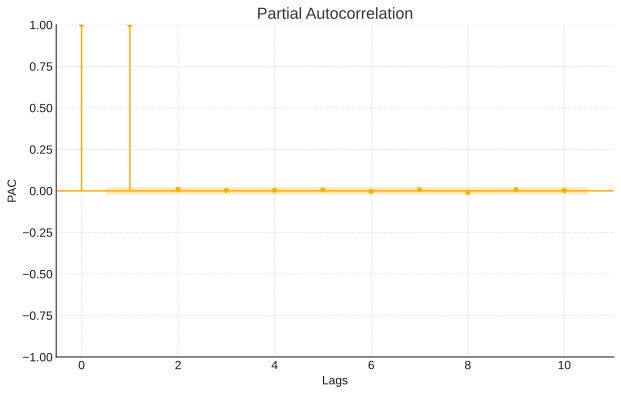

Augmented Dickey-Fuller Test: c
ADF Statistic: -0.8010239377330102
p-value: 0.818821108620174 

Augmented Dickey-Fuller Test: ct
ADF Statistic: -2.0062519288401535
p-value: 0.598023936290415 

KPSS Test: c
KPSS Statistic: 12.372574469445032
p-value: 0.01 

KPSS Test: ct
KPSS Statistic: 12.372574469445032
p-value: 0.01 



In [44]:
unit_root_test(train, 'tclose_adjusted', 10, 10, 5)

In [72]:
stat, pvalues = hegy_test(train['tclose_adjusted'], 5, True, True) # 5 for seasonal dummies since there are around 5 trading days a week.

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.018
Model:                            OLS   Adj. R-squared:                  0.013
Method:                 Least Squares   F-statistic:                     3.774
Date:                Sun, 08 Dec 2024   Prob (F-statistic):           5.43e-14
Time:                        18:14:21   Log-Likelihood:                 26723.
No. Observations:                7745   AIC:                        -5.337e+04
Df Residuals:                    7706   BIC:                        -5.310e+04
Df Model:                          38                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.0033      0.002      2.

    - As we have guessed the data is not stationary since the decay in the acf plot is not exponantial instead it is linear.
    - As for the Seasonality from the last ACF graph we can see that the although the ACF shows a linear decay it still shows an seasonal behaviour over a long time.

For method 'c' adf test

Null Hypothesis (H₀): The time series is non-stationary, indicating a unit root. \
Alternative Hypothesis (H₁): The time series is stationary (it does not have a unit root).

- This result shows that the series is non-stationary.

For method 'c' kpss test

Null Hypothesis (H₀): The time series is stationary (it does not have a unit root). \
Alternative Hypothesis (H₁): The time series is non-stationary, indicating a unit root.

- This result shows that thhe series is non-stationary.

for method 'ct' adf test

Null Hypothesis (H₀): The time series has a stochastic trend, indicating a unit root. \
Alternative Hypothesis (H₁): The time series has a deterministic trend (it does not have a unit root).

- This result shows us a stochastic trend.

for method 'ct' kpss test

Null Hypothesis (H₀): The time series has a deterministic trend. \
Alternative Hypothesis (H₁): The time series has a stochastic trend.

- This result shows us a stochastic trend.

### Judging by the coefficients and the p-values(i.e. our confidence in the values) and the seasonal decomposition:

- Coef for the constant is 0.0044 and the p value for it is 0.013 below 5% so there is probably a constant.
- Coef for the trend is $2.805 * 10^{-7}$ and the p value for it is 0.029 below 5% so there is probably a trend.

 Since we are doing the regression on an differenced series like we do in ADF test, constant's and trend's coefs being non-zero means that the series is non-stationary and has both a trend and a constant.

- We can see that the data has sesaonality both by taking a look at the summary from the Ordinary Least Squares(OLS) model especially the coefs of the last few seasonal dummies, and we can also see the seasonality from the seasoal decomposition.

### Decision:

- We need to take at least one regular difference and at least one seasonal difference

## Removing the trend:
- Since the data is not stationary we need to make the data stationary to work on it with ARIMA models.
- In this step We will be differencing the data and visualizing it again and interpret it again.

In [47]:
train = train.with_columns(
    pl.col("tclose_adjusted").diff().alias("tclose_diff")
)

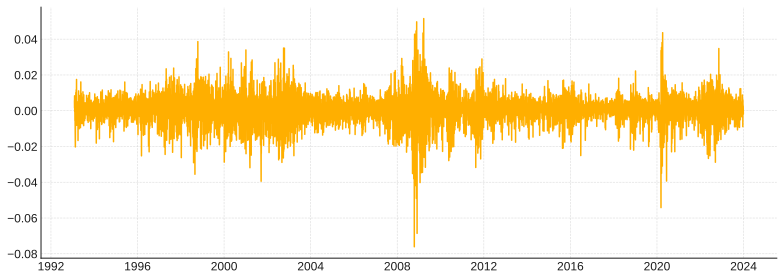

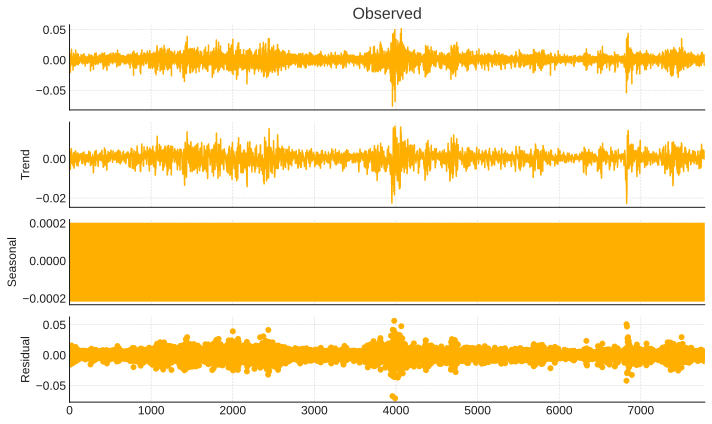

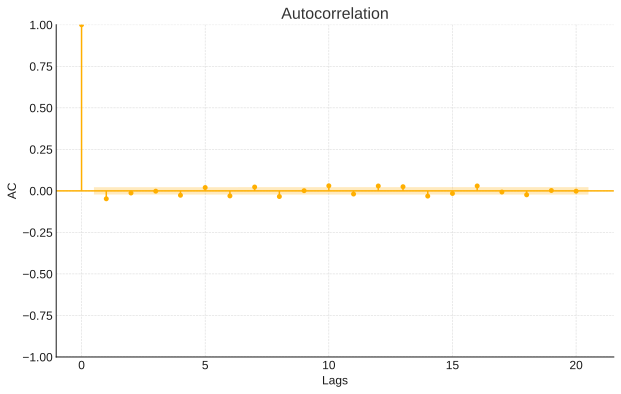

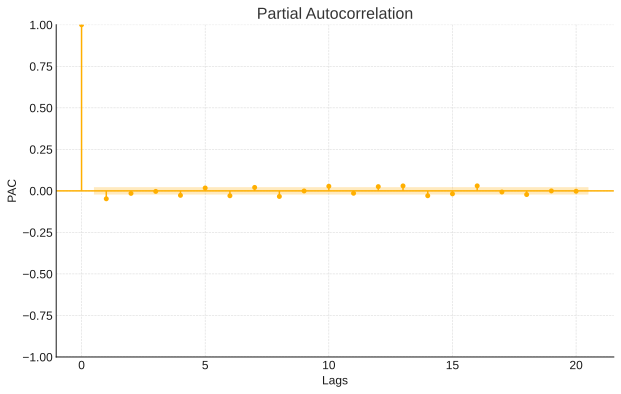

Augmented Dickey-Fuller Test: c
ADF Statistic: -92.52663149275276
p-value: 0.0 

Augmented Dickey-Fuller Test: ct
ADF Statistic: -92.52099617428239
p-value: 0.0 

KPSS Test: c
KPSS Statistic: 0.10196990522712779
p-value: 0.1 

KPSS Test: ct
KPSS Statistic: 0.10196990522712779
p-value: 0.1 



In [48]:
unit_root_test(train[1:], 'tclose_diff', 20, 20, 5)

In [49]:
stat, pvalues = hegy_test(train['tclose_diff'][1:], 5, True, True)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.531
Model:                            OLS   Adj. R-squared:                  0.529
Method:                 Least Squares   F-statistic:                     229.9
Date:                Sun, 08 Dec 2024   Prob (F-statistic):               0.00
Time:                        18:01:56   Log-Likelihood:                 26718.
No. Observations:                7744   AIC:                        -5.336e+04
Df Residuals:                    7705   BIC:                        -5.309e+04
Df Model:                          38                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.0003      0.000      1.

It looks like differencing got rid of both the constant term and also the time parameter.

Just by looking at the ACF and the PACF plots the data seems to be stationary. Let's see the tests and the seasonal decomposition.

We see that there is no constant and also no trend in the differenced data from the coefs and their p-values but the seasonal dummies' coefs and p-values tells us that the seasonal trend is still there.

As we have guessed from the OLS the seasonality is still there.

### Interpretation:

- The tests shows that the data is stationary after taking a regular diff but the seasonal trend is still there, but since it is unusual for a data to need more than one regular differencing the let's try the sesaonal difference and see if that makes the data stationary if that doesn't work either than we can try regular and seasonal differencing together.

In [103]:
train = train.with_columns(
    pl.col("tclose_adjusted").diff(5).alias("tclose_seasonal_diff")
)

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

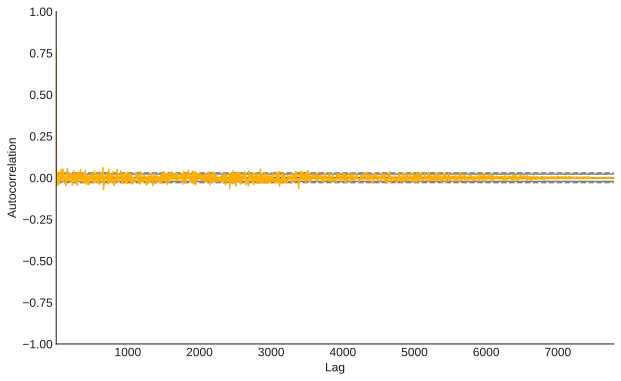

In [104]:
autocorrelation_plot(train['tclose_seasonal_diff'][5:])

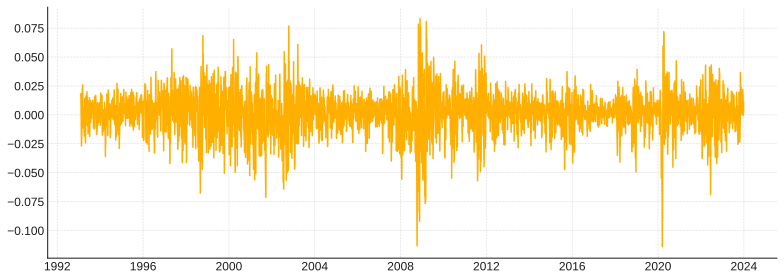

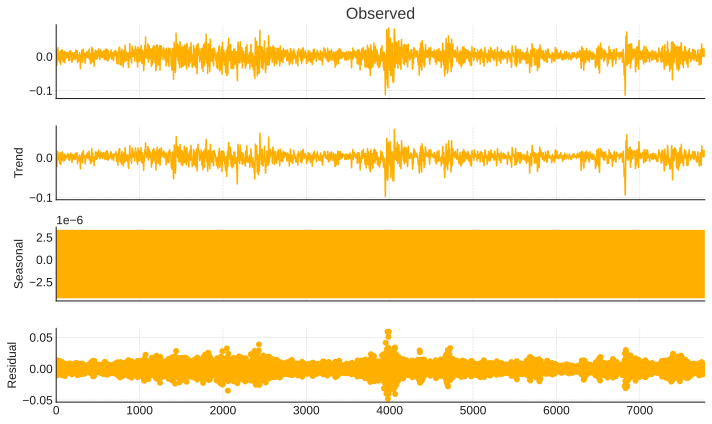

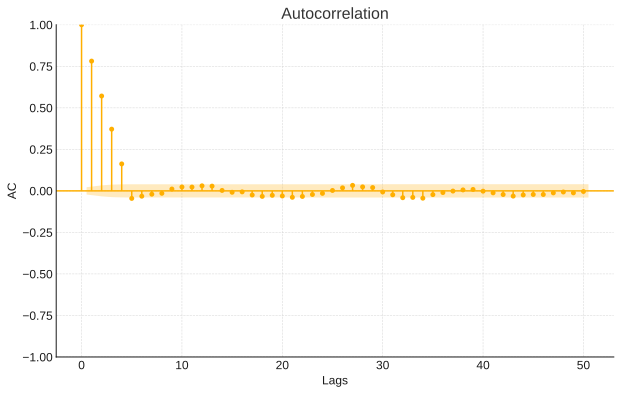

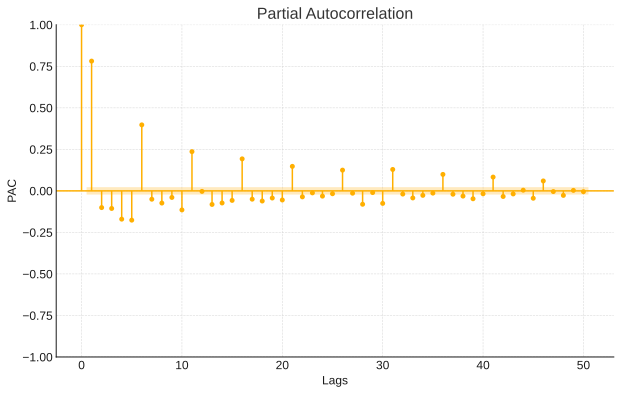

Augmented Dickey-Fuller Test: c
ADF Statistic: -13.702912536132002
p-value: 1.2796507898697852e-25 

Augmented Dickey-Fuller Test: ct
ADF Statistic: -13.702545784485677
p-value: 2.1170947241740144e-21 

KPSS Test: c
KPSS Statistic: 0.1109618085715724
p-value: 0.1 

KPSS Test: ct
KPSS Statistic: 0.1109618085715724
p-value: 0.1 



In [105]:
unit_root_test(train[5:], 'tclose_seasonal_diff', 50, 50, 5)

Similar to the regular difference there is no constant term and also no time parameter.

ACF shows that with only seasonal differencing the data becomes stationary.

In [106]:
stat, pvalues = hegy_test(train['tclose_seasonal_diff'][5:], 5, True, True)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.452
Model:                            OLS   Adj. R-squared:                  0.449
Method:                 Least Squares   F-statistic:                     166.8
Date:                Sun, 08 Dec 2024   Prob (F-statistic):               0.00
Time:                        19:09:49   Log-Likelihood:                 26353.
No. Observations:                7740   AIC:                        -5.263e+04
Df Residuals:                    7701   BIC:                        -5.236e+04
Df Model:                          38                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.0003      0.000      1.

The seasonal trend is gone after taking the seasonal difference. This is shown in both the ACF and the PACF plots and also in the HEGY test(OLS summary).

This shows us that on this particular data we only need to take the seasonal difference since after taking the seasonal difference the data becomes stationary while keeping some memory and also since the seasonal trend is gone we don't need to take any more differences.

### Note:

    - We see that even thoug the series becomes stationary the we tell that it barely stationary from the HEGY test result as well as the Coefficients from the SARIMA model that we found below. In this situation we can take a regular difference to make it completely stationary but this is not a good approach since we will also be losing the memory each data points has in other words the series won't be invertible. This problem can be solved by taking a partial difference which would help us make the series completely stationart while keeping the memory.

## Model selection:

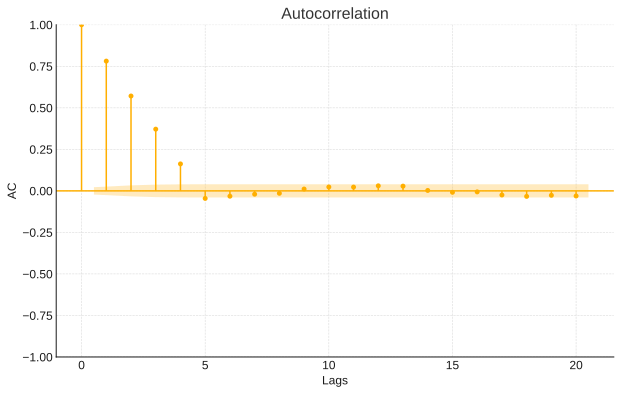

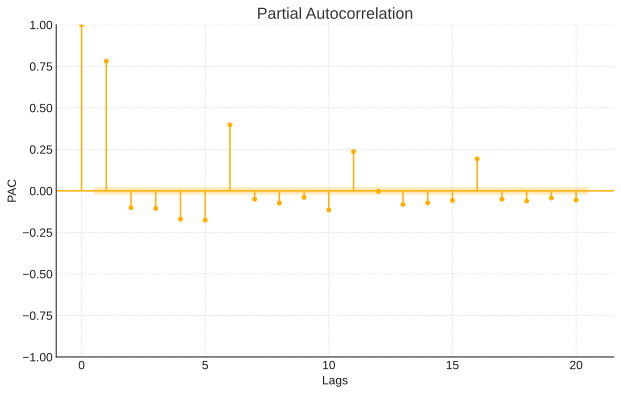

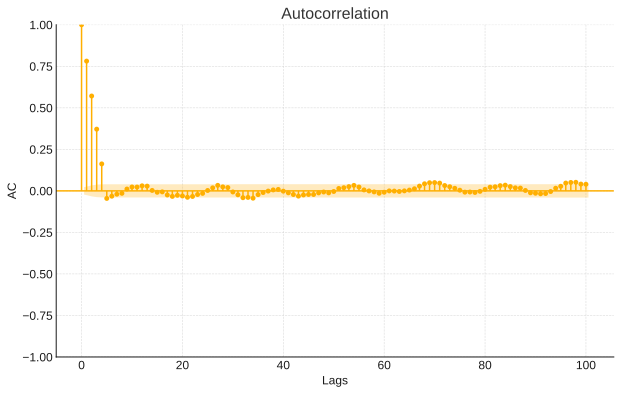

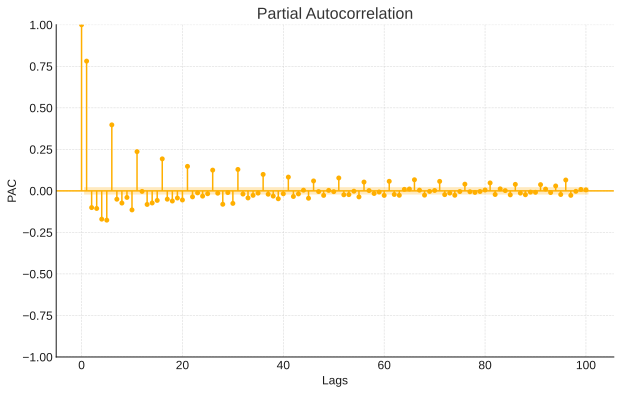

In [74]:
acf_pacf(train[5:], 'tclose_seasonal_diff', 20, 20)
acf_pacf(train[5:], 'tclose_seasonal_diff', 100, 100)

### Final decission:

From the ACF and the PACF plots we can tell the SARIMA parameters:
    
    - For AR: it is 1 since the lags cut off after the first lag in the PACF plot.
    - For I: it is 0 since we didn't take the regular difference.
    - For MA: it is 3 or 4, 4 because after the fourth lag the values cut off in the ACF plot but since we are expecting A seasonal component it might be getting affected which is why we we will take the lags before such as 3(Just to make sure we will also check with MA(1), and MA(2) as well).
As for the Seasonal parameters of the SARIMA model we can look at the lags at 5k k $\geq$ 1 at the ACF and PACF plots. So the parameters:
    
    - For SAR: it is 0 since the values tail off in PACF while we don't see the same in the ACF.
    - For SI: it is 1 since we are taking one seasonal difference.
    - For SMA: It is probably 1 but it might also be 0 since we can't say for sure, we will test both and compare the IC scores.

## Parameter estimation:

In [222]:
model_selection_train = train.to_pandas().set_index('date')
model_selection_test = train.to_pandas()[-20:].set_index('date')

In [79]:
def model_summary(data, order, seasonal_order, trend):
    t1 = time.time()
    model = SARIMAX(endog=data, order=order, seasonal_order=seasonal_order, trend=trend, mle_regression=False)
    results = model.fit(method='powell', disp=False)
    print(results.summary())
    t2 = time.time()
    print('Elapsed time [m]: ', np.round((t2-t1)/60,4))
    gc.collect()

In [87]:
model_summary(model_selection_train['tclose_adjusted'], (1,0,0), (0,1,0,5), 'ct')

                                     SARIMAX Results                                     
Dep. Variable:                   tclose_adjusted   No. Observations:                 7285
Model:             SARIMAX(1, 0, 0)x(0, 1, 0, 5)   Log Likelihood               23032.233
Date:                           Sun, 08 Dec 2024   AIC                         -46056.467
Time:                                   18:50:32   BIC                         -46028.895
Sample:                                        0   HQIC                        -46046.985
                                          - 7285                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0003      0.000      1.093      0.275      -0.000       0.001
drift       7.801e-09   6.61e-08      0.118

In [80]:
model_summary(model_selection_train['tclose_adjusted'], (1,0,1), (0,1,0,5), 'ct')

                                     SARIMAX Results                                      
Dep. Variable:                    tclose_adjusted   No. Observations:                 7285
Model:             SARIMAX(1, 0, 1)x(0, 1, [], 5)   Log Likelihood               23058.931
Date:                            Sun, 08 Dec 2024   AIC                         -46107.862
Time:                                    18:33:49   BIC                         -46073.398
Sample:                                         0   HQIC                        -46096.010
                                           - 7285                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0003      0.000      1.199      0.230      -0.000       0.001
drift       7.774e-09   7.27e-08   

In [86]:
model_summary(model_selection_train['tclose_adjusted'], (1,0,2), (0,1,0,5), 'ct')

                                     SARIMAX Results                                      
Dep. Variable:                    tclose_adjusted   No. Observations:                 7285
Model:             SARIMAX(1, 0, 2)x(0, 1, [], 5)   Log Likelihood               23073.606
Date:                            Sun, 08 Dec 2024   AIC                         -46135.213
Time:                                    18:50:29   BIC                         -46093.856
Sample:                                         0   HQIC                        -46120.990
                                           - 7285                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0004      0.000      1.243      0.214      -0.000       0.001
drift       7.031e-09   7.77e-08   

In [88]:
model_summary(model_selection_train['tclose_adjusted'], (1,0,3), (0,1,0,5), 'ct')

                                     SARIMAX Results                                      
Dep. Variable:                    tclose_adjusted   No. Observations:                 7285
Model:             SARIMAX(1, 0, 3)x(0, 1, [], 5)   Log Likelihood               23565.372
Date:                            Sun, 08 Dec 2024   AIC                         -47116.743
Time:                                    18:51:47   BIC                         -47068.493
Sample:                                         0   HQIC                        -47100.150
                                           - 7285                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0006      0.001      1.054      0.292      -0.000       0.002
drift       1.041e-08   1.41e-07   

In [89]:
model_summary(model_selection_train['tclose_adjusted'], (1,0,4), (0,1,0,5), 'ct')

                                     SARIMAX Results                                      
Dep. Variable:                    tclose_adjusted   No. Observations:                 7285
Model:             SARIMAX(1, 0, 4)x(0, 1, [], 5)   Log Likelihood               25059.661
Date:                            Sun, 08 Dec 2024   AIC                         -50103.321
Time:                                    18:52:40   BIC                         -50048.178
Sample:                                         0   HQIC                        -50084.357
                                           - 7285                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0015      0.001      1.472      0.141      -0.000       0.003
drift       1.741e-08    2.5e-07   

In [90]:
model_summary(model_selection_train['tclose_adjusted'], (1,0,5), (0,1,0,5), 'ct')

                                     SARIMAX Results                                      
Dep. Variable:                    tclose_adjusted   No. Observations:                 7285
Model:             SARIMAX(1, 0, 5)x(0, 1, [], 5)   Log Likelihood               25018.562
Date:                            Sun, 08 Dec 2024   AIC                         -50019.124
Time:                                    18:53:55   BIC                         -49957.088
Sample:                                         0   HQIC                        -49997.789
                                           - 7285                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   1.734e-05   8.61e-06      2.013      0.044    4.58e-07    3.42e-05
drift       -7.81e-10   1.71e-09   

In [81]:
model_summary(model_selection_train['tclose_adjusted'], (1,0,1), (0,1,1,5), 'ct')

                                     SARIMAX Results                                     
Dep. Variable:                   tclose_adjusted   No. Observations:                 7285
Model:             SARIMAX(1, 0, 1)x(0, 1, 1, 5)   Log Likelihood               25055.372
Date:                           Sun, 08 Dec 2024   AIC                         -50098.745
Time:                                   18:36:21   BIC                         -50057.387
Sample:                                        0   HQIC                        -50084.522
                                          - 7285                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    1.77e-06   6.08e-07      2.912      0.004    5.79e-07    2.96e-06
drift       1.411e-10   1.59e-10      0.887

In [82]:
model_summary(model_selection_train['tclose_adjusted'], (1,0,2), (0,1,1,5), 'ct')

                                      SARIMAX Results                                      
Dep. Variable:                     tclose_adjusted   No. Observations:                 7285
Model:             SARIMAX(1, 0, 2)x(0, 1, [1], 5)   Log Likelihood               25054.026
Date:                             Sun, 08 Dec 2024   AIC                         -50094.053
Time:                                     18:41:29   BIC                         -50045.802
Sample:                                          0   HQIC                        -50077.459
                                            - 7285                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     2.8e-06   7.53e-07      3.717      0.000    1.32e-06    4.28e-06
drift      -1.068e-10    1.

In [83]:
model_summary(model_selection_train['tclose_adjusted'], (1,0,3), (0,1,1,5), 'ct')

                                      SARIMAX Results                                      
Dep. Variable:                     tclose_adjusted   No. Observations:                 7285
Model:             SARIMAX(1, 0, 3)x(0, 1, [1], 5)   Log Likelihood               25029.012
Date:                             Sun, 08 Dec 2024   AIC                         -50042.024
Time:                                     18:43:27   BIC                         -49986.881
Sample:                                          0   HQIC                        -50023.060
                                            - 7285                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   7.072e-06   3.91e-06      1.810      0.070   -5.88e-07    1.47e-05
drift       7.291e-10   1.0

In [84]:
model_summary(model_selection_train['tclose_adjusted'], (1,0,4), (0,1,1,5), 'ct')

                                      SARIMAX Results                                      
Dep. Variable:                     tclose_adjusted   No. Observations:                 7285
Model:             SARIMAX(1, 0, 4)x(0, 1, [1], 5)   Log Likelihood               25060.437
Date:                             Sun, 08 Dec 2024   AIC                         -50102.874
Time:                                     18:44:28   BIC                         -50040.838
Sample:                                          0   HQIC                        -50081.540
                                            - 7285                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0015      0.001      1.448      0.148      -0.001       0.003
drift       1.733e-08   2.5

In [91]:
model_summary(model_selection_train['tclose_adjusted'], (0,0,0), (0,1,1,5), 'ct')

                                 SARIMAX Results                                 
Dep. Variable:           tclose_adjusted   No. Observations:                 7285
Model:             SARIMAX(0, 1, [1], 5)   Log Likelihood               19630.250
Date:                   Sun, 08 Dec 2024   AIC                         -39252.499
Time:                           18:54:51   BIC                         -39224.928
Sample:                                0   HQIC                        -39243.017
                                  - 7285                                         
Covariance Type:                     opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0013      0.000      3.350      0.001       0.001       0.002
drift       2.873e-08   9.94e-08      0.289      0.772   -1.66e-07    2.23e-07
ma.S.L5       -0.0449      0

In [96]:
model_summary(model_selection_train['tclose_adjusted'], (1,0,0), (0,1,1,5), 'ct')

                                      SARIMAX Results                                      
Dep. Variable:                     tclose_adjusted   No. Observations:                 7285
Model:             SARIMAX(1, 0, 0)x(0, 1, [1], 5)   Log Likelihood               25030.219
Date:                             Sun, 08 Dec 2024   AIC                         -50050.438
Time:                                     19:06:50   BIC                         -50015.973
Sample:                                          0   HQIC                        -50038.585
                                            - 7285                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   6.029e-06   2.65e-06      2.279      0.023    8.43e-07    1.12e-05
drift       1.512e-10    7.

From both the AIC and BIC we see that:

    - For SMA: As we have guessed the parameter is 1.
    - For MA: Unexpectedly the parameter 0,1,2,3,4 doesn't really affect the model so we will be using 1 to reduce the risk of Overfitting by making the model more complex while also making sure the model captures every pattern possible.

Coefficients:

    - AR(1): 0.9948
    - SMA(1): -0.9863

## Final model:
### SARIMA(1,0,1)$*$(0,1,1)$_{5}$

## Diagnostic Checking:

In [215]:
t1 = time.time()
model = SARIMAX(endog=model_selection_train['tclose_adjusted'],
                order=(1,0,1), seasonal_order=(0,1,1,5), trend='ct')
model_fit = model.fit(method='powell', disp=False)
t2 = time.time()
print('Elapsed time [m]: ', np.round((t2-t1)/60,4))

Elapsed time [m]:  1.8352


In [191]:
model_fit.summary() #["Ljung-Box"]

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                   tclose_adjusted   No. Observations:                 7285
Model:             SARIMAX(1, 0, 1)x(0, 1, 1, 5)   Log Likelihood               25055.372
Date:                           Sun, 08 Dec 2024   AIC                         -50098.745
Time:                                   20:15:21   BIC                         -50057.387
Sample:                                        0   HQIC                        -50084.522
                                          - 7285                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    1.77e-06   6.08e-07      2.912      0.004    5.79e-07    2.96e-06
drift       1.411e-10   1.59e-10      0.887      0.375   -1.71e-10    4.53e-10
ar.L1          0.9981      0.000   2562.691      0.000       0.997       0.999
ma.L1         -0.0513      2e-06  -2.56e+04      0.000      -0.051      -0.051
ma.S.L5       -1.0000   1.71e-07  -5.83e+06      0.000      -1.000      -1.000
sigma2      5.973e-05   4.97e-07    120.151      0.000    5.88e-05    6.07e-05
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):             12306.26
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               0.59   Skew:                            -0.49
Prob(H) (two-sided):                  0.00   Kurtosis:                         9.29
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 4.68e+22. Standard errors may be unstable.
"""

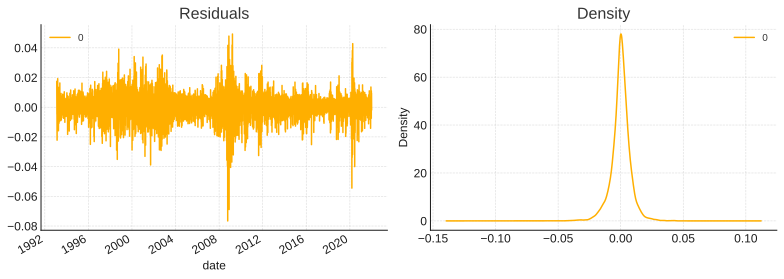

In [192]:
# density plot of residuals
residuals = pd.DataFrame(model_fit.resid)[5:]
fig, ax = plt.subplots(1,2, figsize=(11, 4))
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.tight_layout()
plt.show()

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

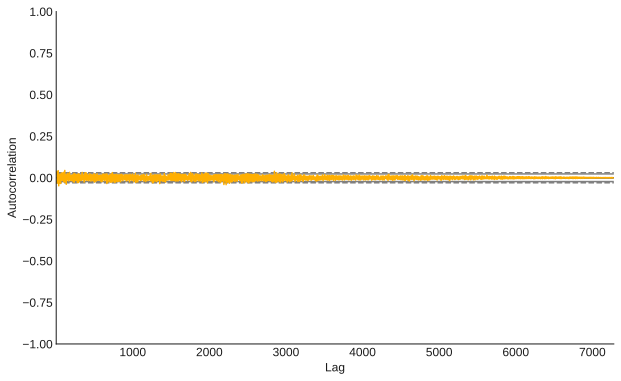

In [193]:
autocorrelation_plot(residuals)

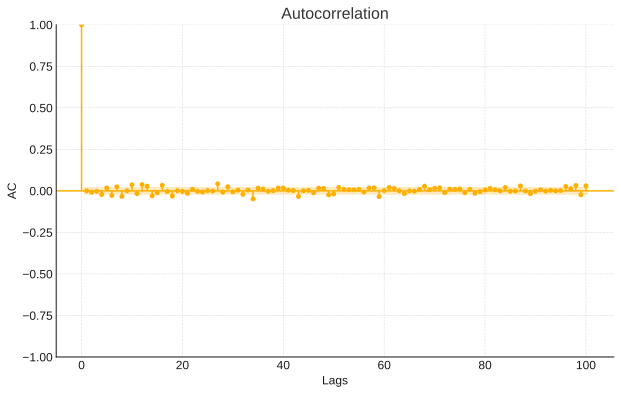

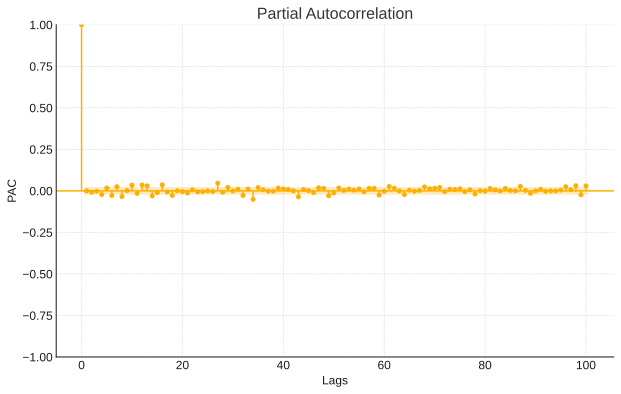

In [194]:
acf_pacf(residuals, 0, 100, 100)

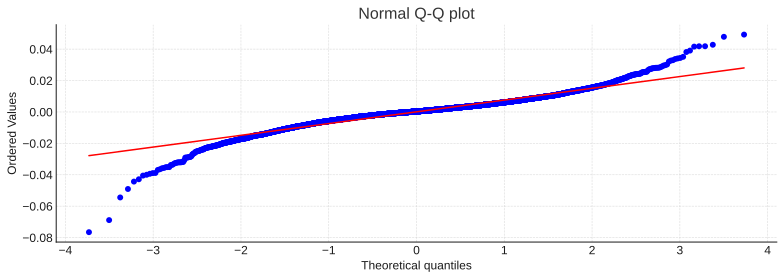

In [195]:
plt.figure(figsize=(11, 4))
stats.probplot(residuals[0], dist="norm", plot=plt)
plt.title('Normal Q-Q plot')
plt.tight_layout()
plt.show()

In [196]:
lm_result = acorr_lm(residuals, period=5)

print('Lagrange Multiplier Test:')
print(f'LM Statistic: {lm_result[0]}')
print(f'p-value: {lm_result[1]} \n')

Lagrange Multiplier Test:
LM Statistic: 33.65061763376302
p-value: 0.00021162269832011453 



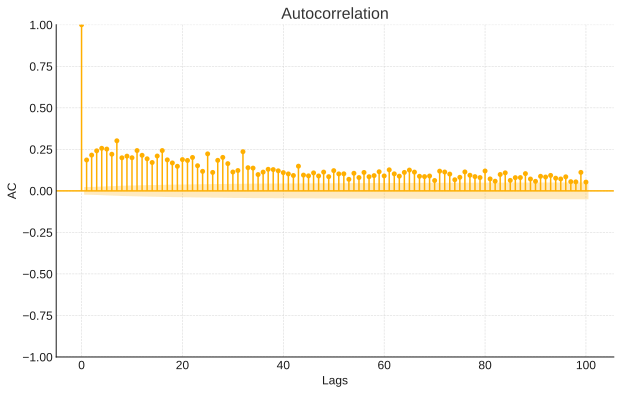

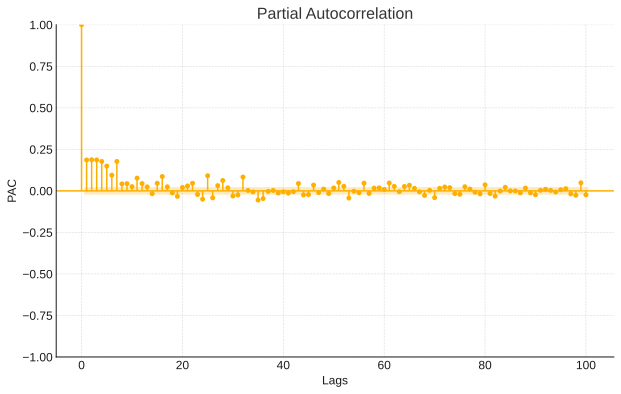

In [197]:
acf_pacf(residuals**2, 0, 100, 100)

In [198]:
arch_test = het_arch(residuals)
print('ARCH Test:')
print(f'LM Statistic: {arch_test[0]},\np-value: {arch_test[1]}')

ARCH Test:
LM Statistic: 1355.7372045716625,
p-value: 3.567334937779536e-285


### Interpretation:

Autocorrelation: From the Ljung-Box statistic, Lagrange Multiplier test, ACF and PACF the residuals don't have autocorrelation but there seems to be outliers around the 2008 stock market crash as well as the other stock market crashes.

Distribution: From the Q-Q plot, histogram and the Jarque-Bera statistic it is clear that the residuals are not normally distributed.

Heteroscedasticity: From the ACF-PACF plots of the squared residuals, and the ARCH Engle's test we can say that the data has heteroscedasticity.

## Forecasting:

### SARIMA:

In [417]:
model = SARIMAX(endog=model_selection_train['tclose_adjusted'][:-20],
            order=(1,0,1), seasonal_order=(0,1,1,5), trend='ct')
model_fit = model.fit(method='powell', disp=False)
output = model_fit.get_forecast(steps=20)

In [425]:
output = output.summary_frame()

In [426]:
predictions = output['mean']

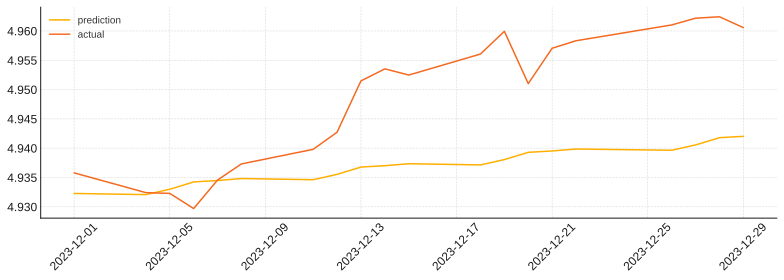

In [428]:
model_selection_test.loc[:,'predictions'] = list(predictions).copy()

plt.figure(figsize=(11,4))
plt.plot(model_selection_test['predictions'], label='prediction')
plt.plot(model_selection_test['tclose_adjusted'], label='actual')
plt.legend(loc="upper left")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Prophet:

In [236]:
model_selection_train['ds'] = model_selection_train.index
model_selection_train['y'] = model_selection_train['tclose_adjusted']

In [246]:
prophet = Prophet()
prophet_fit = prophet.fit(model_selection_train[:-20])
forecast = prophet_fit.predict(model_selection_train[-20:])
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

21:31:13 - cmdstanpy - INFO - Chain [1] start processing
21:31:21 - cmdstanpy - INFO - Chain [1] done processing


,ds,yhat,yhat_lower,yhat_upper
0,2023-12-01,4.957885,4.899167,5.012948
1,2023-12-04,4.958521,4.904053,5.007025
2,2023-12-05,4.958733,4.907726,5.013108
3,2023-12-06,4.958945,4.908251,5.011262
4,2023-12-07,4.959157,4.904874,5.008621
5,2023-12-08,4.959369,4.908850,5.012254
6,2023-12-11,4.960004,4.904122,5.009195
7,2023-12-12,4.960216,4.909434,5.015796
8,2023-12-13,4.960428,4.908364,5.017764
9,2023-12-14,4.960640,4.906881,5.011312


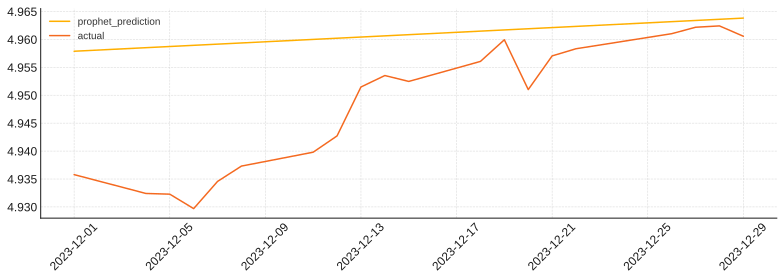

In [308]:
model_selection_test.loc[:,'ppredictions'] = list(forecast['yhat']).copy()

plt.figure(figsize=(11,4))
plt.plot(model_selection_test['ppredictions'], label='prophet_prediction')
plt.plot(model_selection_test['tclose_adjusted'], label='actual')
plt.legend(loc="upper left")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### NN:

In [314]:
from arnet import ARNet

In [375]:
nn = ARNet()
nn_fit = nn.fit(model_selection_train[:-20]['tclose_adjusted'])
forecasts = nn_fit.predict(n_steps=20)

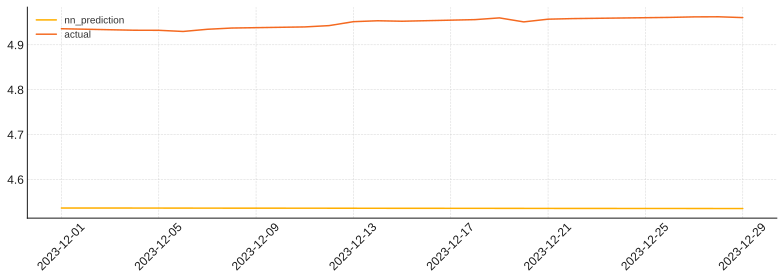

In [376]:
model_selection_test.loc[:,'nnpredictions'] = list(forecasts).copy()

plt.figure(figsize=(11,4))
plt.plot(model_selection_test['nnpredictions'], label='nn_prediction')
plt.plot(model_selection_test['tclose_adjusted'], label='actual')
plt.legend(loc="upper left")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Back transforming the predictions:

$\lambda$ = -0.07279992892834346

In [328]:
model_selection_test[["tclose_adjusted", 'predictions', 'ppredictions', 'nnpredictions']]

,tclose_adjusted,predictions,ppredictions,nnpredictions
date,,,,
2023-12-01,4.935783,4.932272,4.957885,4.519888
2023-12-04,4.932410,4.935427,4.958521,4.615034
2023-12-05,4.932284,4.933426,4.958733,4.549260
2023-12-06,4.929696,4.933583,4.958945,4.615093
2023-12-07,4.934568,4.930134,4.959157,4.549319
2023-12-08,4.937316,4.934590,4.959369,4.615154
2023-12-11,4.939803,4.936791,4.960004,4.549380
2023-12-12,4.942720,4.939905,4.960216,4.615214
2023-12-13,4.951483,4.943067,4.960428,4.549441


In [435]:
for col in ["tclose_adjusted", 'predictions', 'ppredictions', 'nnpredictions']:
    model_selection_test[f'{col}_bt'] = (model_selection_test[col]*const_lambda + 1) ** (1/const_lambda)

model_selection_test

,Close,Day,Weekday,Week,Month,Year,tclose,z_score,tclose_adjusted,tclose_diff,tclose_seasonal_diff,predictions,ppredictions,nnpredictions,tclose_adjusted_bt,predictions_bt,ppredictions_bt,nnpredictions_bt
date,,,,,,,,,,,,,,,,,,
2023-12-01,452.974640,1,4,48,12,2023,4.935783,0.888208,4.935783,0.003780,0.005327,4.932272,4.957885,4.536262,452.974640,450.499356,468.894181,246.160452
2023-12-04,450.596771,4,0,49,12,2023,4.932410,0.112478,4.932410,-0.003373,0.003110,4.932073,4.958521,4.536201,450.596771,450.359981,469.361187,246.137711
2023-12-05,450.507996,5,1,49,12,2023,4.932284,-0.247350,4.932284,-0.000126,0.002349,4.932991,4.958733,4.536139,450.507996,451.004960,469.516966,246.114981
2023-12-06,448.692535,6,2,49,12,2023,4.929696,-1.068581,4.929696,-0.002588,0.000212,4.934238,4.958945,4.536077,448.692535,451.883431,469.672801,246.092262
2023-12-07,452.116241,7,3,49,12,2023,4.934568,-0.498920,4.934568,0.004872,0.002564,4.934480,4.959157,4.536015,452.116241,452.054080,469.828691,246.069552
2023-12-08,454.059937,8,4,49,12,2023,4.937316,-0.407106,4.937316,0.002748,0.001533,4.934818,4.959369,4.535953,454.059937,452.293202,469.984637,246.046853
2023-12-11,455.826080,11,0,50,12,2023,4.939803,-0.458717,4.939803,0.002486,0.007392,4.934616,4.960004,4.535891,455.826080,452.150421,470.452044,246.024163
2023-12-12,457.907928,12,1,50,12,2023,4.942720,-0.836280,4.942720,0.002918,0.010436,4.935529,4.960216,4.535830,457.907928,452.795378,470.608212,246.001484
2023-12-13,464.222534,13,2,50,12,2023,4.951483,1.777651,4.951483,0.008763,0.021788,4.936773,4.960428,4.535768,464.222534,453.674854,470.764435,245.978815


In [344]:
for col in ['yhat', 'yhat_lower', 'yhat_upper']:
    forecast[f'{col}_bt'] = (forecast[col]*const_lambda + 1) ** (1/const_lambda)

forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,...,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat,yhat_bt,yhat_lower_bt,yhat_upper_bt
0,2023-12-01,4.948093,4.899167,5.012948,4.948093,4.948093,0.009791,0.009791,0.009791,0.011621,...,-0.00183,-0.00183,-0.00183,0.0,0.0,0.0,4.957885,468.894181,427.862567,511.225288
1,2023-12-04,4.948730,4.904053,5.007025,4.948730,4.948730,0.009791,0.009791,0.009791,0.011621,...,-0.00183,-0.00183,-0.00183,0.0,0.0,0.0,4.958521,469.361187,431.125668,506.480970
2,2023-12-05,4.948942,4.907726,5.013108,4.948942,4.948942,0.009791,0.009791,0.009791,0.011621,...,-0.00183,-0.00183,-0.00183,0.0,0.0,0.0,4.958733,469.516966,433.595997,511.353896
3,2023-12-06,4.949154,4.908251,5.011262,4.949154,4.949154,0.009791,0.009791,0.009791,0.011621,...,-0.00183,-0.00183,-0.00183,0.0,0.0,0.0,4.958945,469.672801,433.949963,509.869784
4,2023-12-07,4.949366,4.904874,5.008621,4.949366,4.949366,0.009791,0.009791,0.009791,0.011621,...,-0.00183,-0.00183,-0.00183,0.0,0.0,0.0,4.959157,469.828691,431.676169,507.754990
5,2023-12-08,4.949578,4.908850,5.012254,4.949578,4.949578,0.009791,0.009791,0.009791,0.011621,...,-0.00183,-0.00183,-0.00183,0.0,0.0,0.0,4.959369,469.984637,434.354679,510.666569
6,2023-12-11,4.950214,4.904122,5.009195,4.950214,4.950214,0.009790,0.009790,0.009790,0.011620,...,-0.00183,-0.00183,-0.00183,0.0,0.0,0.0,4.960004,470.452044,431.171582,508.214004
7,2023-12-12,4.950426,4.909434,5.015796,4.950426,4.950426,0.009790,0.009790,0.009790,0.011620,...,-0.00183,-0.00183,-0.00183,0.0,0.0,0.0,4.960216,470.608212,434.749652,513.523823
8,2023-12-13,4.950638,4.908364,5.017764,4.950638,4.950638,0.009790,0.009790,0.009790,0.011620,...,-0.00183,-0.00183,-0.00183,0.0,0.0,0.0,4.960428,470.764435,434.026684,515.118296
9,2023-12-14,4.950850,4.906881,5.011312,4.950850,4.950850,0.009790,0.009790,0.009790,0.011620,...,-0.00183,-0.00183,-0.00183,0.0,0.0,0.0,4.960640,470.920714,433.026123,509.909871


In [380]:
forecasts_bt = (forecasts*const_lambda + 1) ** (1/const_lambda)
forecasts_bt

0     246.160452
1     246.137711
2     246.114981
3     246.092262
4     246.069552
5     246.046853
6     246.024163
7     246.001484
8     245.978815
9     245.956157
10    245.933508
11    245.910869
12    245.888241
13    245.865623
14    245.843015
15    245.820416
16    245.797828
17    245.775250
18    245.752682
19    245.730124
dtype: float64

In [434]:
for col in output.columns[1:]:
    output[f'{col}_bt'] = (output[col]*const_lambda + 1) ** (1/const_lambda)

output

tclose_adjusted,mean,mean_se,mean_ci_lower,mean_ci_upper,mean_se_bt,mean_ci_lower_bt,mean_ci_upper_bt
7766,4.932272,0.007787,4.917010,4.947533,1.007819,439.908214,461.364531
7767,4.932073,0.010754,4.910995,4.953152,1.010817,435.807440,465.435107
7768,4.932991,0.013007,4.907498,4.958484,1.013098,433.441962,469.333667
7769,4.934238,0.014874,4.905085,4.963390,1.014993,431.818382,472.952090
7770,4.934480,0.016488,4.902163,4.966796,1.016635,429.860428,475.481625
7771,4.934818,0.018030,4.899481,4.970156,1.018205,428.071382,477.991410
7772,4.934616,0.019409,4.896576,4.972657,1.019612,426.143148,479.868015
7773,4.935529,0.020662,4.895033,4.976026,1.020893,425.122947,482.409371
7774,4.936773,0.021812,4.894023,4.979522,1.022069,424.456134,485.062169
7775,4.937011,0.022874,4.892178,4.981844,1.023158,423.241300,486.832010


In [436]:
# evaluate forecasts
sarima_score = math.sqrt(mean_squared_error(model_selection_test['predictions_bt'], model_selection_test['Close']))
print('Test RMSE: %.3f' %sarima_score)

Test RMSE: 10.411


In [382]:
# evaluate forecasts
prophet_score = math.sqrt(mean_squared_error(model_selection_test['ppredictions_bt'], model_selection_test['Close']))
print('Test RMSE: %.3f' %prophet_score)

Test RMSE: 11.337


In [383]:
# evaluate forecasts
nn_score = math.sqrt(mean_squared_error(model_selection_test['nnpredictions_bt'], model_selection_test['Close']))
print('Test RMSE: %.3f' %nn_score)

Test RMSE: 199.222


In [486]:
def plot_forecast(prediction_df, prediction_col, fitvals, lower, upper, model_type):
    plt.figure(figsize=(11,4))
    plt.plot(model_selection_train[-100:]['Close'], label='series')
    plt.plot(model_selection_test[prediction_col], label='prediction', linestyle="--")
    plt.plot(fitvals, label='Fitted Values')
    plt.axvline(model_selection_train[-21:-20].index)
    plt.fill_between(
        model_selection_test.index,
        prediction_df[lower],  # Lower bound
        prediction_df[upper],  # Upper bound
        color="gray",
        alpha=0.3,
        label="95% prediction interval"
    )
    plt.legend(loc="upper left")
    plt.xticks(rotation=45)
    plt.title(model_type)
    plt.tight_layout()
    plt.show()

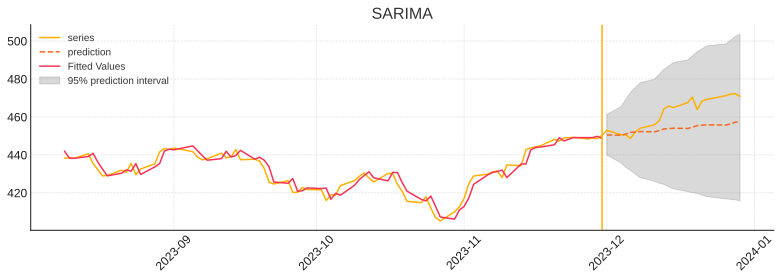

In [458]:
# SARIMA
plot_forecast(output, 'predictions_bt', sarima_fitvals[-80:], 'mean_ci_lower_bt', 'mean_ci_upper_bt', 'SARIMA')

In [ ]:
prophet_fitvals = prophet_fit.predict(model_selection_train[-100:-20])['yhat']

In [491]:
prophet_fitvals = pd.DataFrame((prophet_fitvals*const_lambda + 1) ** (1/const_lambda)).set_index(model_selection_train[-100:-20].index)

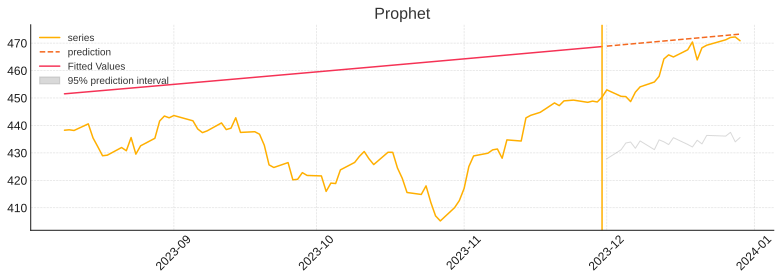

In [492]:
# Prophet
plot_forecast(forecast, 'ppredictions_bt', prophet_fitvals, 'yhat_lower_bt', 'yhat_lower_bt', 'Prophet')

### Comparing RMSE score:
    
    - SARIMA: 10.411
    - Prophet: 11.337
    - Neural Network(1 hidden layer): 199.222

SARIMA has the best score, which is expected since we are focusing on making the predictions in better for the SARIMA model. Prophet score is quite close to the SARIMA models which is suprising since we didn't tune the model at all so, which tells that it might be the best option when it comes to forecasting quickly and effectively. The neural network model that has one hidden layer performed the worst out of all the models which is quite normal since neural networks need at least some finetuning.

## Conclusion:

    For daily usage prophet is better since it is good for time efficieny and since it has a good score but still for production either the prophet needs to be finetuned for the data or the SARIMAX needs to be adjusted better. Additionaly we didn't get rid of heteroscadasticity in the residuals and just skipped it, these should be adjusteed.